> This tutorial is about GODE: Graph fourier transform based Outlier Detection using Emprical Bayesian thresholding paper.

# Install

In [1]:
!pip install git+https://github.com/seoyeonc/GODE_pkg.git

  Cloning https://github.com/seoyeonc/GODE_pkg.git to /tmp/pip-req-build-yj3lha0v
  Running command git clone --filter=blob:none --quiet https://github.com/seoyeonc/GODE_pkg.git /tmp/pip-req-build-yj3lha0v
  Resolved https://github.com/seoyeonc/GODE_pkg.git to commit 31de35a92b36c51f792474ca0e6d96840364818f
  Preparing metadata (setup.py) ... done
  Created wheel for GODE-pkg: filename=GODE_pkg-0.0.1-py3-none-any.whl size=5549 sha256=9620982596f7b580e2b9433f9b31f17d4eb473218cf0e7dc87e9590d1669d5b9
  Stored in directory: /tmp/pip-ephem-wheel-cache-pidojor0/wheels/31/6c/30/59343bcf10b1fadb0fee243ad2b5ea8efc398ff37f2fd2b4b9
Successfully built GODE-pkg


# 0. Import

In [2]:
import GODE_ebayes

In [3]:
import numpy as np
import pandas as pd

In [4]:
from pygsp import graphs, filters, plotting, utils
import pickle

# 1. Linear

## 1.1. Data

*Data description*

- Graph ${\cal G}=({\cal V},E,{\bf W})$
- Vertex set ${\cal V}=\{1,2,\dots,n\}=\{ v_1,v_2,\dots,v_N\}$
- $N=1000$
- $W_{ij} = \begin{cases} 1, & \text{ if } j-i = 1 \\ 0, & \text{ otherwise}\end{cases}$ 
- Graph signal $y:{\cal V} \to \mathbb{R}$

$$y_i=\frac{10}{N}v_i+\eta_i+\epsilon_i,$$ 

- $\eta_i = \begin{cases} U(5,7) & \text{ with probability 0.025}\\ U(-7,-5) & \text{ with probability 0.025} \\ 0 & \text{ otherwise } \end{cases}$ 
- $\epsilon_i \sim N(0,1)$

*Generate Dataset*

In [5]:
np.random.seed(6)

n = 1000
eta_sparsity = 0.05

epsilon = np.around(np.random.normal(size=n),15)
signal = np.random.choice(np.concatenate((np.random.uniform(-7, -5, round(n*eta_sparsity/2)).round(15), np.random.uniform(5, 7, round(n*eta_sparsity/2)).round(15), np.repeat(0, n - round(n*eta_sparsity)))), n)
eta = signal + epsilon

outlier_true_linear= signal.copy()
outlier_true_linear = list(map(lambda x: 1 if x!=0 else 0,outlier_true_linear))

x_1 = np.linspace(0,2,n)
y1_1 = 5 * x_1
y_1 = y1_1 + eta # eta = signal + epsilon

_df=pd.DataFrame({'x':x_1, 'y':y_1})

index_of_trueoutlier_bool = signal!=0

## 1.2. GODE

In [6]:
Lin = GODE_ebayes.Linear(_df)

In [7]:
Lin.fit(sd=20)

In [8]:
outlier_old_linear, outlier_linear, outlier_index_linear = GODE_ebayes.GODE_Anomalous(Lin(_df),contamination=0.05)

## 1.3. Plot

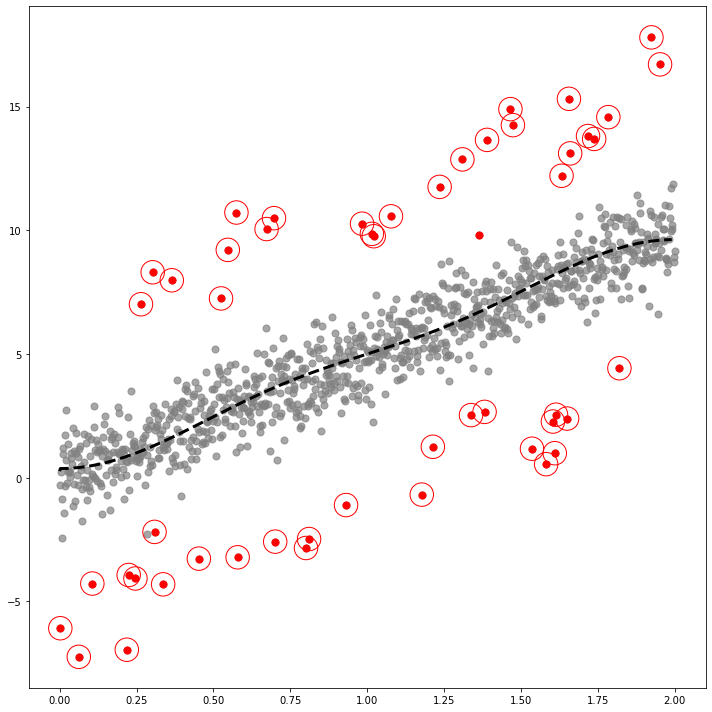

In [9]:
GODE_ebayes.Linear_plot(Lin(_df),index_of_trueoutlier_bool, outlier_index_linear)

*how to access data*

In [10]:
Lin(_df)['x'][:10]

array([0.        , 0.002002  , 0.004004  , 0.00600601, 0.00800801,
       0.01001001, 0.01201201, 0.01401401, 0.01601602, 0.01801802])

In [11]:
Lin(_df)['y'][:10]

array([-0.31178367, -6.08358567,  0.23784081, -0.86906177, -2.44674061,
        0.96330157,  1.18712379, -1.44402316,  1.71937116, -0.33980351])

In [12]:
Lin(_df)['yhat'][:10]

array([0.26224717, 0.37091714, 0.37104804, 0.3712662 , 0.3715716 ,
       0.37196424, 0.37244408, 0.37301111, 0.3736653 , 0.37440661])

## 1.4. Confusion matrix

In [13]:
Conf_linear = GODE_ebayes.Conf_matrx(outlier_true_linear,outlier_linear)

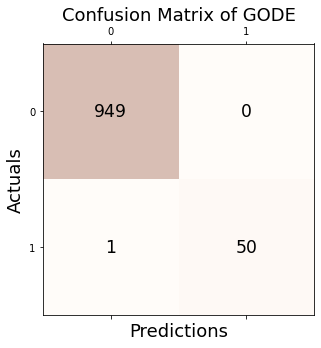

Accuracy: 0.999
Precision: 1.000
Recall: 0.980
F1 Score: 0.990


In [14]:
Conf_linear.conf('GODE')

In [15]:
Conf_linear()

{'Accuracy': 0.999,
 'Precision': 1.0,
 'Recall': 0.9803921568627451,
 'F1 Score': 0.99009900990099}

---

# 2. Orbit

## 2.1. Data

*Data description*

- Graph ${\cal G}=({\cal V},E,{\bf W})$
- $N=1000$ 
- ${\boldsymbol v}_i=(r_i \cos(\theta_i), r_i \sin(\theta_i))$
- $r_i= 5 + \cos(\frac{12\pi (i - 1)}{n - 1})$ 
- $\theta_i= -\pi + \frac{{\pi(N-2)(i - 1)}}{N(N - 1)}$
- graph signal $y:{\cal V} \to \mathbb{R}$

$$y_i = 10 \cdot \sin\left(\frac{{6\pi \cdot (i - 1)}}{{N - 1}}\right)+\epsilon_i+\eta_i$$

- $\eta_i = \begin{cases} U(1,4) & \text{ with probability 0.025}\\ U(-4,-1) & \text{ with probability 0.025} \\ 0 & \text{ otherwise } \end{cases}$ 
- $\epsilon_i \sim N(0,1)$
- ${\bf W} = \begin{cases} \exp\left(-\frac{|{\boldsymbol v}_i -{\boldsymbol v}_j|^2}{2\theta^2}\right), & \text{ if } |{\boldsymbol v}_i - {\boldsymbol v}_j| \le \kappa \\ 0, & \text{ otherwise}\end{cases}$ 
- $\theta=6.45$ and $\kappa=1.21$

*Generate Dataset*

In [16]:
n = 1000
eta_sparsity = 0.05
random_seed=77
np.random.seed(777)
epsilon = np.around(np.random.normal(size=n),15)
signal = np.random.choice(np.concatenate((np.random.uniform(-4, -1, round(n * eta_sparsity / 2)).round(15), np.random.uniform(1, 4, round(n * eta_sparsity / 2)).round(15), np.repeat(0, n - round(n * eta_sparsity)))), n)
eta = signal + epsilon
pi=np.pi
ang=np.linspace(-pi,pi-2*pi/n,n)
r=5+np.cos(np.linspace(0,12*pi,n))
vx=r*np.cos(ang)
vy=r*np.sin(ang)
f1=10*np.sin(np.linspace(0,6*pi,n))
f = f1 + eta
_df = pd.DataFrame({'x' : vx, 'y' : vy, 'f' : f,'f1':f1})
outlier_true_orbit = signal.copy()
outlier_true_orbit = list(map(lambda x: 1 if x!=0 else 0,outlier_true_orbit))
index_of_trueoutlier_bool = signal!=0

## 2.2. GODE

In [17]:
Or = GODE_ebayes.Orbit(_df)

In [18]:
Or.fit(sd=15,method = 'Euclidean',kappa=1.21)

100%|██████████| 1000/1000 [00:01<00:00, 697.19it/s]


In [19]:
outlier_old_orbit, outlier_orbit, outlier_index_orbit = GODE_ebayes.GODE_Anomalous(Or(_df),contamination=0.05)

## 2.3. Plot

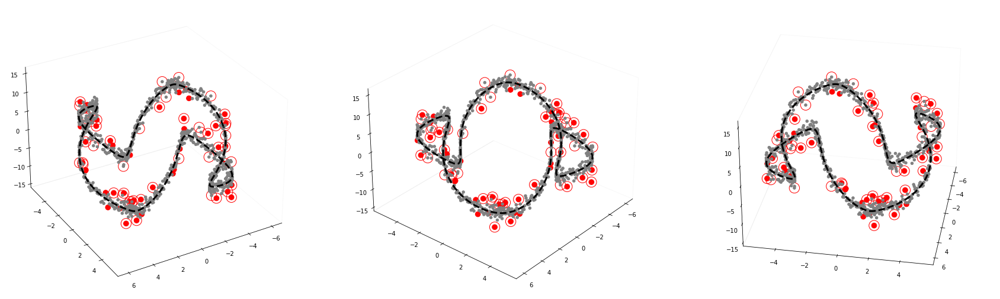

In [20]:
GODE_ebayes.Orbit_plot(Or(_df),index_of_trueoutlier_bool,outlier_index_orbit)

*how to access data*

In [21]:
Or(_df)['x'][:5]

array([-6.        , -5.99916963, -5.9966797 , -5.99253378, -5.98673778])

In [22]:
Or(_df)['y'][:5]

array([-7.34788079e-16, -3.76943905e-02, -7.53604665e-02, -1.12969981e-01,
       -1.50494820e-01])

In [23]:
Or(_df)['f1'][:5]

array([0.        , 0.18867305, 0.37727893, 0.56575049, 0.75402065])

In [24]:
Or(_df)['f'][:5]

array([-0.46820879, -0.63415181,  0.31189882, -0.14761143,  1.66037153])

In [25]:
Or(_df)['fhat'][:5]

array([-0.12358846,  0.28544397,  0.69162952,  0.75432307,  0.83443358])

## 2.4. Confusion matrix

In [26]:
Conf_orbit = GODE_ebayes.Conf_matrx(outlier_true_orbit,outlier_orbit)

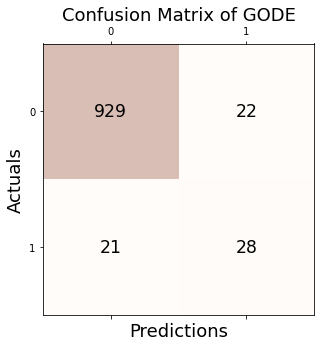

Accuracy: 0.957
Precision: 0.560
Recall: 0.571
F1 Score: 0.566


In [27]:
Conf_orbit.conf('GODE')

In [28]:
Conf_orbit()

{'Accuracy': 0.957,
 'Precision': 0.56,
 'Recall': 0.5714285714285714,
 'F1 Score': 0.5656565656565656}

---

# 3. Bunny

## 3.1. Data

*Data description*

- Stanford bunny data
- $n=2503$

*Generate Dataset*

In [32]:
eta_sparsity = 0.05
random_seed=77
n = 2503
with open("Bunny.pkl", "rb") as file:
    loaded_obj = pickle.load(file)
_df = pd.DataFrame({'x':loaded_obj['x'],'y':loaded_obj['y'],'z':loaded_obj['z'],'f':loaded_obj['f']+loaded_obj['noise'],'f1':loaded_obj['f'],'noise':loaded_obj['noise']})
outlier_true_bunny = loaded_obj['unif'].copy()
outlier_true_bunny = list(map(lambda x: 1 if x !=0  else 0,outlier_true_bunny))
index_of_trueoutlier_bool_bunny = loaded_obj['unif']!=0
_W = loaded_obj['W'].copy()

## 3.2. GODE

In [36]:
bu = GODE_ebayes.BUNNY(_df,_W)

In [37]:
bu.fit(sd=20)

In [38]:
outlier_old_bunny, outlier_bunny, outlier_index_bunny = GODE_ebayes.GODE_Anomalous(bu(_df),contamination=eta_sparsity)

## 3.3. Plot

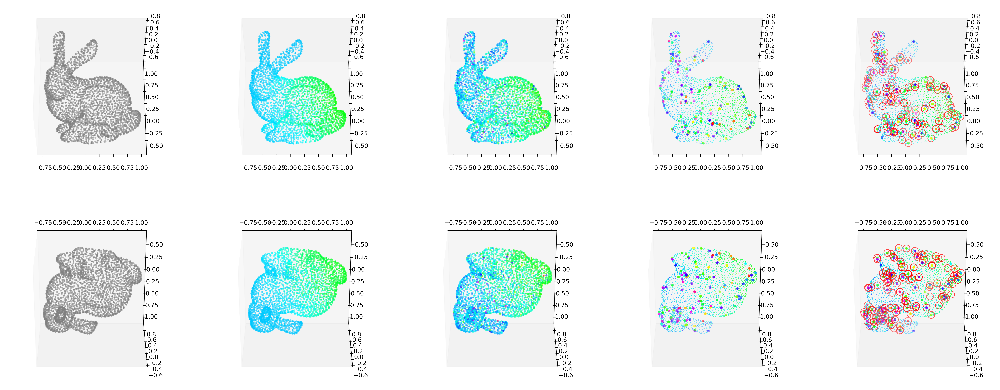

In [39]:
GODE_ebayes.Bunny_plot(bu(_df),index_of_trueoutlier_bool_bunny,outlier_index_bunny)

*how to access data*

In [40]:
bu(_df)

{'x': array([ 0.26815193, -0.58456893, -0.02730755, ...,  0.15397547,
        -0.45056488, -0.29405249]),
 'y': array([ 0.39314334,  0.63468595,  0.33280949, ...,  0.80205526,
         0.6207154 , -0.40187451]),
 'z': array([-0.13834514, -0.22438843,  0.08658215, ...,  0.33698514,
         0.58353051, -0.08647485]),
 'f1': array([-1.54422488, -0.03596483, -0.93972715, ..., -0.01924028,
        -0.02470869, -0.26266752]),
 'f': array([-1.63569131,  0.49423926, -1.04026277, ..., -1.0694093 ,
        -0.24395499,  0.41729667]),
 'fhat': array([-1.66060553,  0.09516849, -1.11731239, ...,  0.23695946,
         0.16766298, -0.11652469])}

## 3.4. Confusion matrix

In [41]:
Conf_bunny = GODE_ebayes.Conf_matrx(outlier_true_bunny,outlier_bunny)

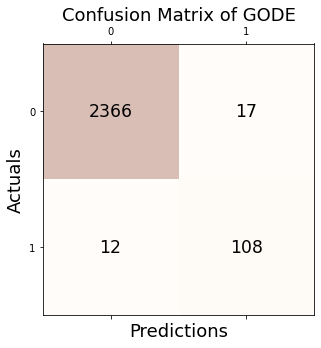

Accuracy: 0.988
Precision: 0.864
Recall: 0.900
F1 Score: 0.882


In [42]:
Conf_bunny.conf('GODE')

In [43]:
Conf_bunny()

{'Accuracy': 0.9884139033160207,
 'Precision': 0.864,
 'Recall': 0.9,
 'F1 Score': 0.8816326530612244}

---

# 4. Earthquake

## 4.1. Data

*Data description*

- [USGS data](https://earthquake.usgs.gov/earthquakes/search/) from $2010$ to $2014$


- Graph ${\cal G}=({\cal V},E,{\bf W})$
- Vertex set ${\cal V}= \{v_1, v_2, \ldots, v_n\}$
- $v:= \tt{( Latitude}$,  $\tt{Longitude)}$
- $N=10762$
- ${\bf W_{ij}} = \begin{cases} \exp(-\frac{\rho(i,j)}{2 \theta^2}), & \text{ if } |\rho(i,j)| \le \kappa \\ 0, & \text{ otherwise}\end{cases}$ 
- $\rho(i,j)=hs({\boldsymbol v}_i, {\boldsymbol v}_j)$
- $\theta = 8810.87$ and $\kappa = 2500$
- graph signal $y:{\cal V} \to \mathbb{R}$

In [44]:
_df = pd.read_csv('./earthquake_tutorial.csv')

In [45]:
_df = _df.assign(Year=list(map(lambda x: x.split('-')[0], _df.time))).rename(columns={'latitude' : 'x', 'longitude' : 'y', 'mag': 'f'}).iloc[:,1:]
_df.Year = _df.Year.astype(np.float64)

## 4.2. GODE

In [46]:
Er = GODE_ebayes.Earthquake(_df.query("2010 <= Year < 2011"))

In [47]:
Er.fit(sd=20, method = 'Haversine',kappa=2500)

100%|██████████| 4790/4790 [00:30<00:00, 157.15it/s]


In [48]:
outlier_old_earthquake, outlier_earthquake, outlier_index_earthquake = GODE_ebayes.GODE_Anomalous(Er(_df.query("2010 <= Year < 2011")),contamination=0.05)


## 4.3. Plot

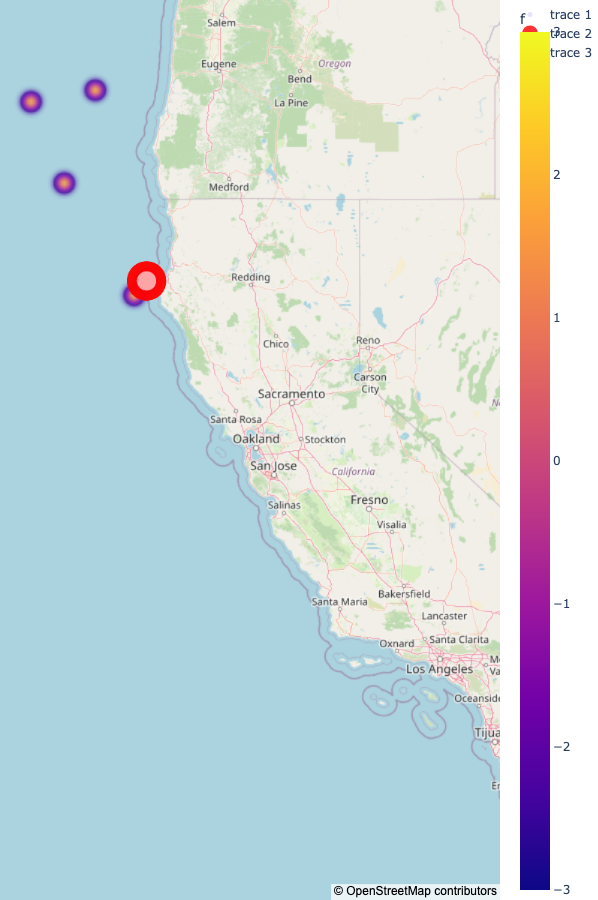

In [49]:
GODE_ebayes.Earthquake_plot(Er(_df.query("2010 <= Year < 2011")),outlier_index_earthquake,lat_center=37.7749, lon_center=-122.4194,fThresh=7,adjzoom=5,adjmarkersize = 40)

*how to access data*

In [50]:
Er(_df.query("2010 <= Year < 2011"))

{'x': array([  0.663, -19.209, -31.83 , ...,  40.726,  30.646,  26.29 ]),
 'y': array([ -26.045,  167.902, -178.135, ...,   51.925,   83.791,   99.866]),
 'f': array([5.5, 5.1, 5. , ..., 5. , 5.2, 5. ]),
 'fhat': array([5.55678619, 5.05719136, 5.02115785, ..., 5.49869582, 5.45532648,
        5.42616814])}